In [1]:
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import seaborn as sns
import pandas as pd
import numpy as np
import tensorflow as tf

from utils import *
from tensorflow.keras.layers import *

# Preparing the numeric Data

In [2]:
data = pd.read_csv('./dataset/data-final-1.csv', infer_datetime_format=True, header=0, index_col='datetime')

C:\Users\Bintang\AppData\Local\Temp\ipykernel_17868\3605832206.py:1: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  data = pd.read_csv('./dataset/data-final-1.csv', infer_datetime_format=True, header=0, index_col='datetime')


In [3]:
data.columns

Index(['Temperature', 'Humidity', 'Illumination', 'kat_temperature',
       'kat_humidity', 'kat_illumination', 'Kipas', 'Humidifier', 'LED'],
      dtype='object')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8866 entries, 03/07/2023 0:00:00 to 10/07/2023 23:16:00
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Temperature       8866 non-null   float64
 1   Humidity          8866 non-null   int64  
 2   Illumination      8866 non-null   float64
 3   kat_temperature   8866 non-null   int64  
 4   kat_humidity      8866 non-null   int64  
 5   kat_illumination  8866 non-null   int64  
 6   Kipas             8866 non-null   int64  
 7   Humidifier        8866 non-null   int64  
 8   LED               8866 non-null   int64  
dtypes: float64(2), int64(7)
memory usage: 692.7+ KB


In [5]:
data = data[[col for col in data.columns if not col.startswith('kat_')]]

In [6]:
stats = data.describe()
stats.pop('Kipas')
stats.pop('LED') 
stats.pop('Humidifier')
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
Temperature,8866.0,29.948850,1.032873,27.6,28.90,30.20,30.80,32.80
Humidity,8866.0,66.783555,4.345455,54.0,64.00,67.00,70.00,76.00
Illumination,8866.0,73.429239,1.497201,69.6,72.82,73.24,73.65,80.59


In [7]:
train, val = train_test_split(data, test_size=.2, random_state=1, shuffle=False)
_, test = train_test_split(data, test_size=.2, random_state=1, shuffle=False)

In [8]:
del _

In [9]:
y_train_fan, y_train_humid, y_train_led = format_output(train)
y_val_fan, y_val_humid, y_val_led = format_output(val)
y_test_fan, y_test_humid, y_test_led = format_output(test)

In [10]:
x_train = norm_data(train, stats)
x_val = norm_data(val, stats) 
x_test = norm_data(test, stats)

x_train = x_train.to_numpy()
x_val = x_val.to_numpy()
x_test = x_test.to_numpy()

In [11]:
type(x_train)  

numpy.ndarray

In [12]:
type(x_train) == type(x_val) == type(x_test)

True

In [13]:
print("Shape of x_train before reshaping:", x_train.shape)
print("Shape of x_val before reshaping:", x_val.shape)
print("Shape of x_test before reshaping:", x_test.shape)

# Reshape the data to be 3D for LSTM input
x_train = x_train.reshape((x_train.shape[0], 1, x_train.shape[1]))
x_val = x_val.reshape((x_val.shape[0], 1, x_val.shape[1]))
x_test = x_test.reshape((x_test.shape[0], 1, x_test.shape[1]))

# Check the shape after reshaping
print("Shape of x_train after reshaping:", x_train.shape)
print("Shape of x_val after reshaping:", x_val.shape)
print("Shape of x_test after reshaping:", x_test.shape)


Shape of x_train before reshaping: (7092, 3)
Shape of x_val before reshaping: (1774, 3)
Shape of x_test before reshaping: (1774, 3)
Shape of x_train after reshaping: (7092, 1, 3)
Shape of x_val after reshaping: (1774, 1, 3)
Shape of x_test after reshaping: (1774, 1, 3)


# Preparing the Images Data

In [14]:
import os

In [15]:
img_path = os.path.join('dataset', 'imgs')
img_path

'dataset\\imgs'

In [16]:
classes = [x for x in os.listdir(img_path)]
classes

['hama', 'normal', 'penyakit']

In [17]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.,
    validation_split=.2,
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=.2)

In [18]:
train_data = data_generator.flow_from_directory(
    img_path,
    target_size=(128, 128),
    batch_size=bs,
    color_mode='rgb',
    classes=classes,
    class_mode='sparse',
    subset='training',
    shuffle=False
)

data_val = data_generator.flow_from_directory(
    img_path,
    target_size=(128, 128),
    batch_size=bs,
    color_mode='rgb',
    classes=classes,
    class_mode='sparse',
    subset='validation',
    shuffle=False
)

data_test = test_generator.flow_from_directory(
    img_path,
    target_size=(128, 128),
    batch_size=bs,
    color_mode='rgb',
    classes=classes,
    class_mode='sparse',
    subset='validation',
    shuffle=False
)

Found 240 images belonging to 3 classes.
Found 60 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


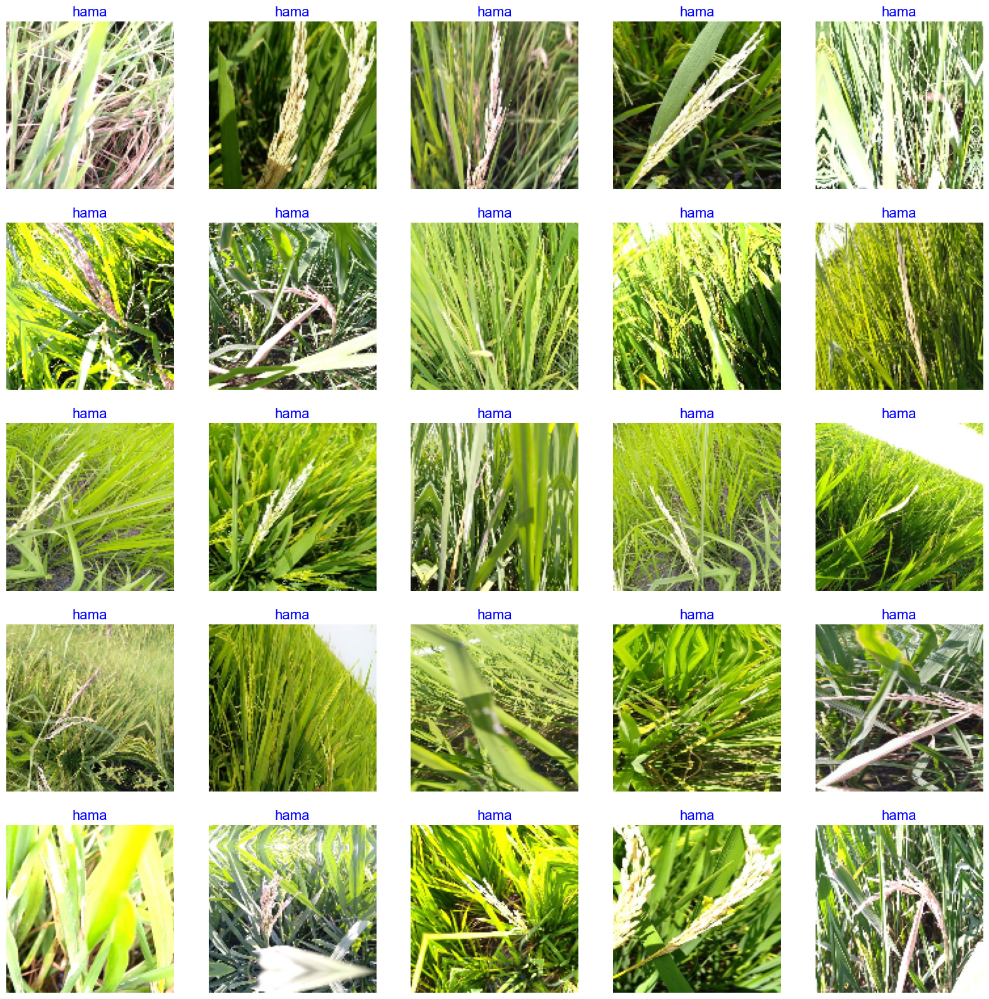

In [19]:
show_image_samples(train_data, classes)

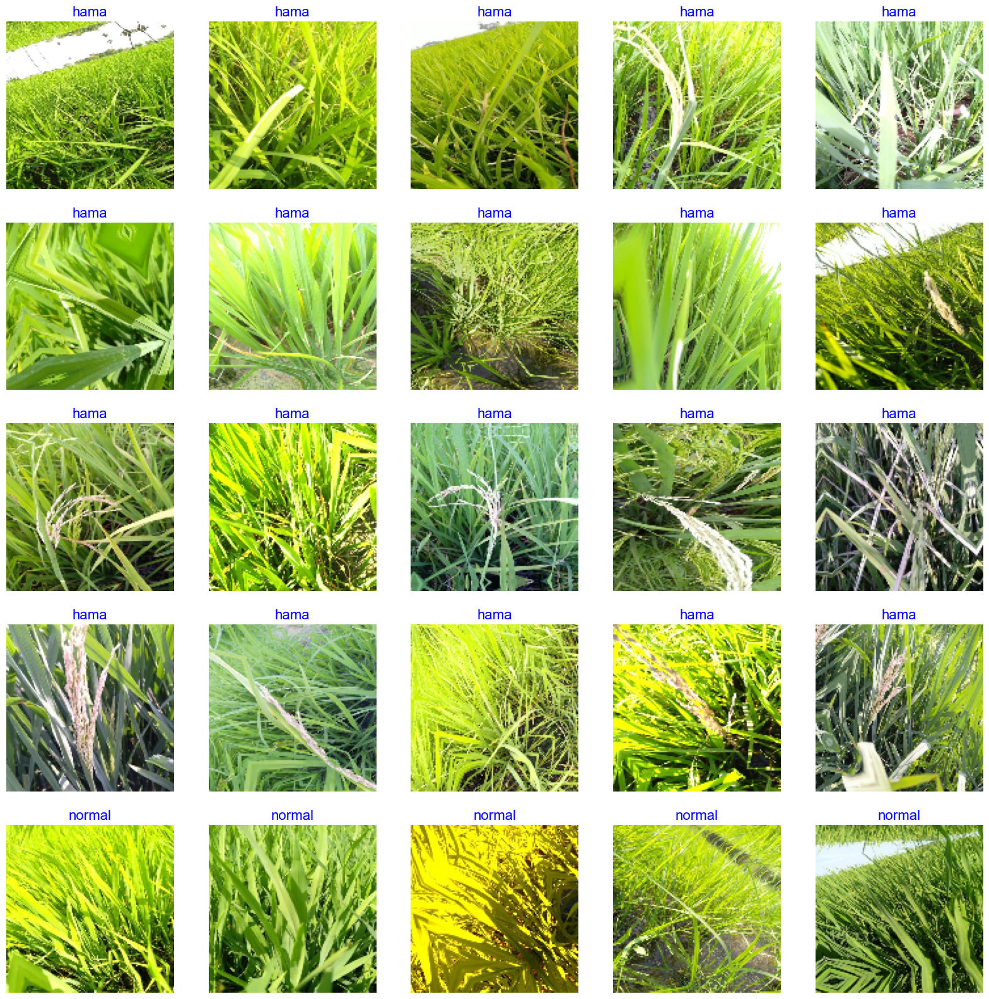

In [20]:
show_image_samples(data_val, classes)

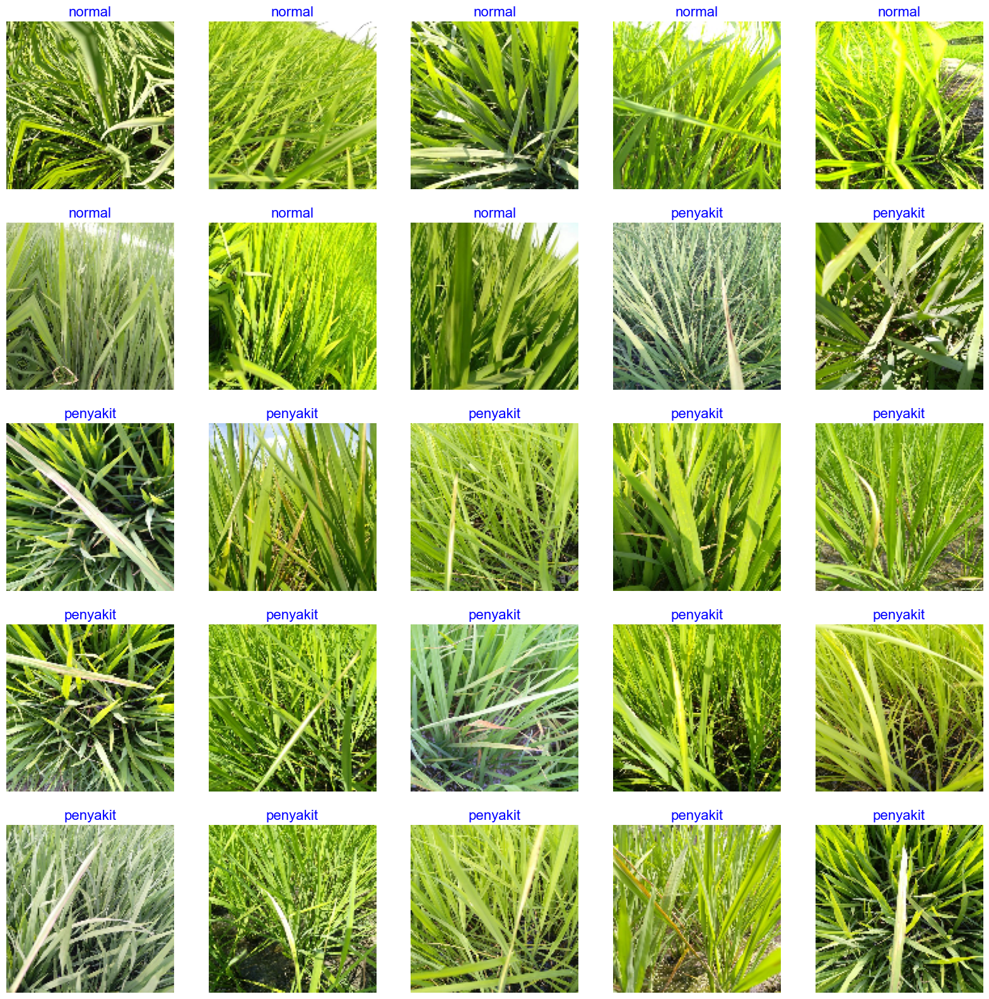

In [21]:
show_image_samples(data_val, classes)

# Create the models

In [22]:
def img_base_model(input_layer):
    base_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_shape=(128, 128, 3))
    for layer in base_model.layers:
        layer.trainable = False
    x = base_model(input_layer)
    x = Flatten()(x)
    return x

def num_base_model(input_layer):
    x = Conv1D(32, 5, padding='causal', activation='relu')(input_layer)
    x = LSTM(64, return_sequences=True)(x)
    x = LSTM(64, return_sequences=True)(x)
    x = Flatten()(x)
    return x

def shared_dense_layers(input_layer):
    x = Dense(512, activation='relu')(input_layer)
    return x



In [23]:
img_input = Input(shape=(128, 128, 3), name='img_input')
num_input = tf.keras.layers.Input(shape=(x_train.shape[1], x_test.shape[2]), name='num_input')

img_features = img_base_model(img_input)
num_features = num_base_model(num_input)

combined_features = Concatenate()([img_features, num_features])
shared_features = shared_dense_layers(combined_features)


In [24]:
img_output = Dense(len(classes), activation='softmax', name='img_output')(shared_features)
fan_output = Dense(1, activation='sigmoid', name='fan_output')(shared_features)
led_output = Dense(1, activation='sigmoid', name='led_output')(shared_features)
humid_output = Dense(1, activation='sigmoid', name='humid_output')(shared_features)

model = tf.keras.models.Model(inputs=[img_input, num_input], outputs=[img_output, fan_output, led_output, humid_output])

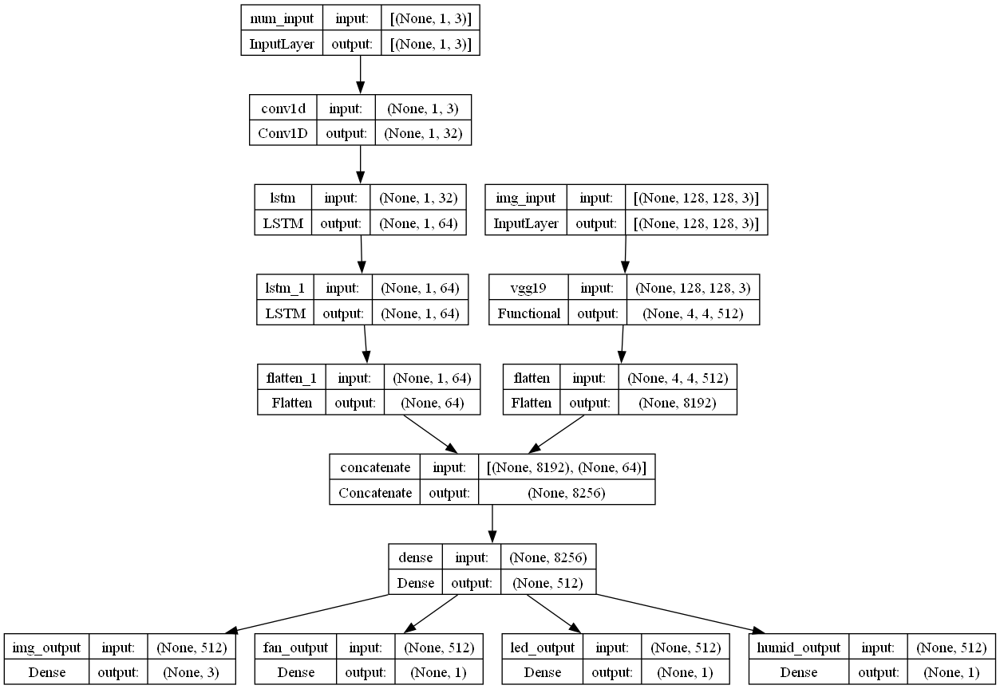

In [25]:
print_model(model, tf)

In [26]:
opt = tf.keras.optimizers.SGD(learning_rate=.0001, momentum=.9)
model.compile(optimizer=opt, 
              loss={'img_output': 'sparse_categorical_crossentropy', 
                    'fan_output': 'binary_crossentropy', 
                    'led_output': 'binary_crossentropy', 
                    'humid_output': 'binary_crossentropy'},
              metrics={'img_output': 'accuracy', 
                       'fan_output': 'accuracy', 
                       'led_output': 'accuracy', 
                       'humid_output': 'accuracy'})

# Combining Dataset

In [27]:
def combined_generator(image_gen, time_series_data, y_fan, y_led, y_humid):
    while True:
        img_data, img_labels = next(image_gen)
        batch_size = img_data.shape[0]
        batch_indices = np.random.randint(0, time_series_data.shape[0], batch_size)
        num_data = time_series_data[batch_indices]
        y_fan_batch = y_fan[batch_indices]
        y_led_batch = y_led[batch_indices]
        y_humid_batch = y_humid[batch_indices]
        yield [img_data, num_data], {'img_output': img_labels, 'fan_output': y_fan_batch, 'led_output': y_led_batch, 'humid_output': y_humid_batch}

train_gen = combined_generator(train_data, x_train, y_train_fan, y_train_led, y_train_humid)
val_gen = combined_generator(data_val, x_val, y_val_fan, y_val_led, y_val_humid)
test_gen = combined_generator(data_test, x_test, y_test_fan, y_test_led, y_test_humid)


In [28]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    steps_per_epoch=len(train_data),
    validation_steps=len(data_val),
    epochs=50,
    verbose=2
)

Epoch 1/50
8/8 - 10s - loss: 3.2870 - img_output_loss: 1.3723 - fan_output_loss: 0.3858 - led_output_loss: 0.6774 - humid_output_loss: 0.8515 - img_output_accuracy: 0.1958 - fan_output_accuracy: 0.9042 - led_output_accuracy: 0.5083 - humid_output_accuracy: 0.4333 - val_loss: 1.9015 - val_img_output_loss: 1.1559 - val_fan_output_loss: 0.0755 - val_led_output_loss: 0.3684 - val_humid_output_loss: 0.3017 - val_img_output_accuracy: 0.3500 - val_fan_output_accuracy: 1.0000 - val_led_output_accuracy: 0.9000 - val_humid_output_accuracy: 0.9667 - 10s/epoch - 1s/step
Epoch 2/50
8/8 - 2s - loss: 2.5802 - img_output_loss: 1.2938 - fan_output_loss: 0.0765 - led_output_loss: 0.5218 - humid_output_loss: 0.6881 - img_output_accuracy: 0.2042 - fan_output_accuracy: 0.9875 - led_output_accuracy: 0.8083 - humid_output_accuracy: 0.7000 - val_loss: 1.6734 - val_img_output_loss: 1.1262 - val_fan_output_loss: 0.0116 - val_led_output_loss: 0.3173 - val_humid_output_loss: 0.2183 - val_img_output_accuracy: 0.36

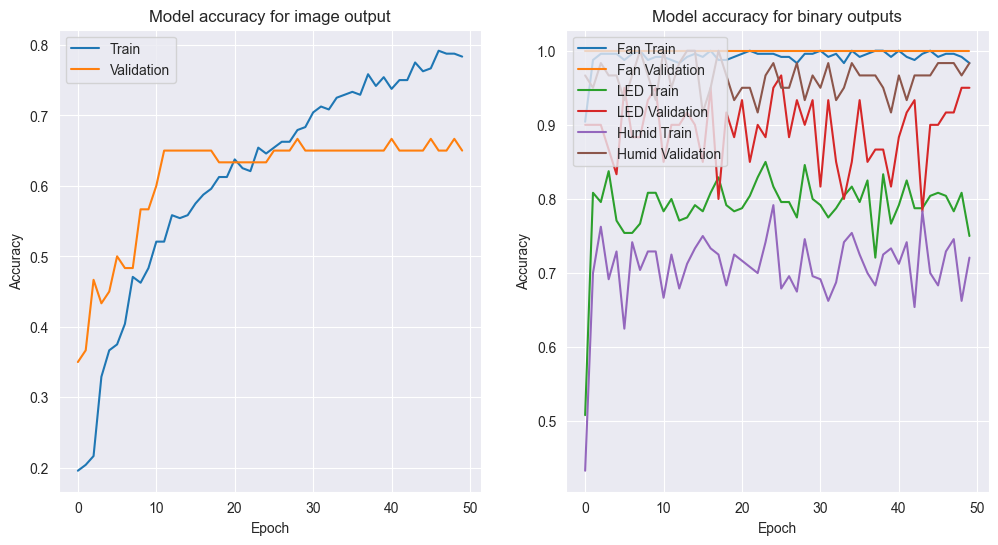

In [29]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['img_output_accuracy'])
plt.plot(history.history['val_img_output_accuracy'])
plt.title('Model accuracy for image output')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['fan_output_accuracy'])
plt.plot(history.history['val_fan_output_accuracy'])
plt.plot(history.history['led_output_accuracy'])
plt.plot(history.history['val_led_output_accuracy'])
plt.plot(history.history['humid_output_accuracy'])
plt.plot(history.history['val_humid_output_accuracy'])
plt.title('Model accuracy for binary outputs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Fan Train', 'Fan Validation', 'LED Train', 'LED Validation', 'Humid Train', 'Humid Validation'], loc='upper left')

plt.show()

In [30]:
loss, img_loss, fan_loss, led_loss, humid_loss, img_acc, fan_acc, led_acc, humid_acc = model.evaluate(test_gen, steps=len(data_val))

2/2 [==============================] - 0s 143ms/step - loss: 17.0704 - img_output_loss: 7.9800 - fan_output_loss: 0.2469 - led_output_loss: 6.7387 - humid_output_loss: 2.1049 - img_output_accuracy: 0.4333 - fan_output_accuracy: 0.9667 - led_output_accuracy: 0.3000 - humid_output_accuracy: 0.7667


In [31]:
print(
    f"fan loss : {fan_loss * 100 :.2f}",
    f"led loss : {led_loss * 100 :.2f}",
    f"humid loss : {humid_loss * 100 :.2f}",
    f"Image loss : {img_loss * 100 : .2f} \n",
    f"total loss : {loss * 100 :.2f} \n",
    f"fan accuracy : {fan_acc * 100 :.2f}",
    f"led accuracy : {led_acc * 100 :.2f}",
    f"humid accuracy : {humid_acc * 100 :.2f}",
    f"Image accuracy : {img_acc * 100 : .2f}",
    
    sep='\n'
)

fan loss : 24.69
led loss : 673.87
humid loss : 210.49
Image loss :  798.00 

total loss : 1707.04 

fan accuracy : 96.67
led accuracy : 30.00
humid accuracy : 76.67
Image accuracy :  43.33


In [32]:
img_predictions, fan_predictions, led_predictions, humid_predictions = model.predict(test_gen, steps=len(data_val))
img_pred_classes = np.argmax(img_predictions, axis=1)

2/2 [==============================] - 1s 11ms/step


In [33]:
fan_label = y_test_fan[:60]
humid_label = y_test_humid[:60]
led_label = y_test_led[:60]

In [34]:
cm_fan = confusion_matrix(fan_label, np.round(fan_predictions))
cm_led = confusion_matrix(led_label, np.round(led_predictions))
cm_humid = confusion_matrix(humid_label, np.round(humid_predictions))
cm_img = confusion_matrix(img_pred_classes, data_test.labels)

In [40]:
to_print = [[cm_fan, 'Fan'], [cm_led, "LED"], [cm_humid, 'Humidifier']]

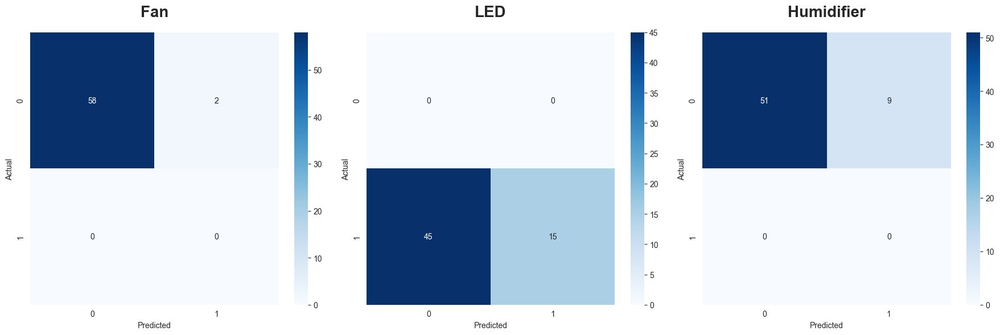

In [41]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, var in enumerate(to_print):
    plot_confusion_matrix(var[0], var[1], ax=axes[idx])
    
plt.tight_layout()
plt.show()

<Axes: >

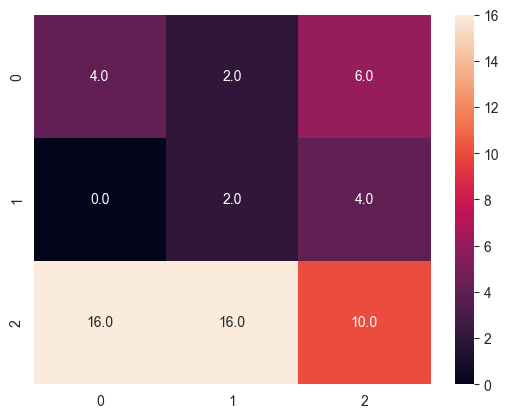

In [45]:
sns.heatmap(cm_img, annot=True, fmt='.1f')

In [46]:
classes

['hama', 'normal', 'penyakit']